In [2]:
import datetime
import numpy as np
import pandas as pd
import xarray as xr
import astropy.units as u
import matplotlib.pyplot as plt
import matplotlib.gridspec as grd
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
#from evaluation_functions import ensemble_evaluation_functions as eef
#import sunspots.sunspots as sunspots
import re  #for dealing with non-numeric characters in a string of unknown length

import matplotlib as mpl
import os
import time

import huxt as H
import huxt_analysis as HA
import huxt_inputs as Hin

import scipy.interpolate
from scipy import integrate
from scipy.optimize import curve_fit

from sunpy.coordinates.sun import carrington_rotation_time
from sunpy.coordinates.sun import carrington_rotation_number

# ensemble functions
import huxt_ensemble_functions as hef 
import calibration_functions as cf

c:\Users\ct832900\AppData\Local\miniconda3\envs\wsahuxt\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
c:\Users\ct832900\AppData\Local\miniconda3\envs\wsahuxt\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
def ICMElist(filepath = None):
    # -*- coding: utf-8 -*-
    """
    A script to read and process Ian Richardson's ICME list.

    Some pre-processing is required:
        Download the following webpage as a html file: 
            http://www.srl.caltech.edu/ACE/ASC/DATA/level3/icmetable2.htm
        Open in Excel, remove the year rows, delete last column (S) which is empty
        Cut out the data table only (delete header and footer)
        Save as a CSV.

    """
    
    if filepath is None:
        datapath =  system._setup_dirs_()['datapath']
        filepath = os.path.join(datapath,
                                'icmetable.csv')
    
    
    icmes=pd.read_csv(filepath,header=None)
    #delete the first row
    icmes.drop(icmes.index[0], inplace=True)
    icmes.index = range(len(icmes))
    
    for rownum in range(0,len(icmes)):
        for colnum in range(0,3):
            #convert the three date stamps
            datestr=icmes[colnum][rownum]
            year=int(datestr[:4])
            month=int(datestr[5:7])
            day=int(datestr[8:10])
            hour=int(datestr[11:13])
            minute=int(datestr[13:15])
            #icmes.set_value(rownum,colnum,datetime(year,month, day,hour,minute,0))
            icmes.at[rownum,colnum] = datetime.datetime(year,month, day,hour,minute,0)
            
        #tidy up the plasma properties
        for paramno in range(10,17):
            dv=str(icmes[paramno][rownum])
            if dv == '...' or dv == 'dg' or dv == 'nan':
                #icmes.set_value(rownum,paramno,np.nan)
                icmes.at[rownum,paramno] = np.nan
            else:
                #remove any remaining non-numeric characters
                dv=re.sub('[^0-9]','', dv)
                #icmes.set_value(rownum,paramno,float(dv))
                icmes.at[rownum,paramno] = float(dv)
        
    
    #chage teh column headings
    icmes=icmes.rename(columns = {0:'Shock_time',
                                  1:'ICME_start',
                                  2:'ICME_end',
                                  10:'dV',
                                  11: 'V_mean',
                                  12:'V_max',
                                  13:'Bmag',
                                  14:'MCflag',
                                  15:'Dst',
                                  16:'V_transit'})
    return icmes

def compute_lead_time_stats(df):

    df_ = df.copy()
    
    # Calculating the statistics
    df_['mean'] = df_.mean(axis=1)
    df_['median'] = df_.median(axis=1)
    df_['min'] = df_.min(axis=1)
    df_['max'] = df_.max(axis=1)
    df_['lower_1_sigma'] = df_.apply(lambda row: np.percentile(row, 15.87), axis=1)
    df_['upper_1_sigma'] = df_.apply(lambda row: np.percentile(row, 84.13), axis=1)
    df_['lower_2_sigma'] = df_.apply(lambda row: np.percentile(row, 2.28), axis=1)
    df_['upper_2_sigma'] = df_.apply(lambda row: np.percentile(row, 97.72), axis=1)

    return df_

def date_from_ensemble_folder_name(fname):
    
    """
    extracts date from wsa filename

    Args:
        fname (string) : name of ensemble file set
    Returns:
        date_string (string) : date string generated from info within file string format
        date_obj (datetime) : datetime object from file name
    """

    pattern = r'_(\d{4})(\d{2})(\d{2})(\d{2})'
    match = re.search(pattern, fname)
    year, month, day, hour = match.groups()
    date_string = f'{year}-{month}-{day}--{hour}'
    date_obj = datetime.datetime.strptime(date_string, '%Y-%m-%d--%H')

    return date_string, date_obj

In [ ]:
# def crps_discrete(forecast_probs, forecast_values, observed_value):
#     """
#     Compute CRPS for a discretized probabilistic forecast.

#     Parameters:
#         forecast_probs (array): Probabilities for discrete forecast values.
#         forecast_values (array): Corresponding values for the forecast.
#         observed_value (float): Observed value.
    
#     Returns:
#         float: CRPS value.
#     """
#     # CDF from forecast probabilities
#     forecast_cdf = np.cumsum(forecast_probs)
    
#     # Define empirical CDF
#     empirical_cdf = (forecast_values >= observed_value).astype(float)
    
#     # Compute CRPS as the sum of squared differences
#     crps_value = np.sum((forecast_cdf - empirical_cdf)**2)
#     return crps_value

# # Example: Discretized forecast
# forecast_probs = np.array([0.2, 0.5, 0.3])  # Probabilities for bins
# forecast_values = np.array([385, 460, 550])     # Bin centers
# observed_value = 440                      # Observed wind speed

# # Compute CRPS
# crps_value = crps_discrete(forecast_probs, forecast_values, observed_value)
# print(f"CRPS (discrete): {crps_value:.4f}")

CRPS (discrete): 0.1300


In [5]:
# omni data directory
omni_data_dir = 'C:\\Users\\ct832900\\Desktop\\Research_Code\\WSA_calibration\\data\\OMNI\\Processed_omni\\'

# load the data into dataframe and index by datetime
omni_data = pd.read_hdf(omni_data_dir + 'omni_1hour.h5')
omni_data = omni_data.set_index('datetime')
#omni_data = omni_data.dropna(subset = ['V']) # Remove rows with NaN values

## Create verificaton dataset with ICMEs removed from the timeseries
df_ICME = ICMElist("C:\\Users\\ct832900\\Desktop\\Research_Code\\WSA_Calibration\\data\\icmetable.csv")
df_ICME = df_ICME.set_index('Shock_time')

# Create a list of ICME (start,end) times 
CME_flags = [*zip(df_ICME.loc['2020':'2023']['ICME_start'], df_ICME.loc['2020':'2023']['ICME_end'])]

# Loop through ICME timing list and remove observations within CME start/end crossing period.
df_temp = omni_data.copy()
for start_time, end_time in CME_flags:
    
    # Replace values with NaN for rows within the specified time period
    df_temp.loc[(df_temp.index >= start_time) & (df_temp.index <= end_time)] = np.nan

    # Remove from time_series 
    #df_filtered = df_temp[~((df_temp.index >= start_time) & (df_temp.index <= end_time))]
    #df_temp = df_filtered.copy()

df_filtered = df_temp.copy()  

c:\Users\ct832900\AppData\Local\miniconda3\envs\wsahuxt\lib\site-packages\pandas\core\indexes\base.py:7588: FutureWarning: Dtype inference on a pandas object (Series, Index, ExtensionArray) is deprecated. The Index constructor will keep the original dtype in the future. Call `infer_objects` on the result to get the old behavior.
  return Index(sequences[0], name=names)


In [8]:
# ensemble parameters
ensemble_size = 100
sigma_latitude = 10 # degrees
sigma_longitude = 0 # degrees
forecast_window = 10 * u.day
r_min = 21.5*u.solRad
year_str = '2023'

year_id = {'2023':'', '2020':'_2020'} # awkward file string formating stuff which will be removed when I fix the file name consistency

# get all ensemble netCDF file strings of specified parameters
ensemble_directory_path = os.path.abspath(os.path.join(os.pardir,'data','ensembles'))
ensemble_file_words = [f'ens_{int(sigma_latitude)}_{ensemble_size}{year_id[year_str]}'] # keywords to filter ensemble set directory
ensemble_fname = hef.get_files_containing_words(ensemble_directory_path, ensemble_file_words)[0]

all_files = os.listdir(os.path.abspath(os.path.join(os.pardir,'data','ensembles',ensemble_fname))) # list of all files inside ensemble directory

dates = []
filenames = []

# creating list of filenames of ensemble files for reading in ensembles over a specfied date range
for filename in all_files:

    #unpack ensemble datenum into an indexable datetime obj
    pattern = r'_(\d{4})(\d{2})(\d{2})(\d{2})'
    match = re.search(pattern, filename)
    year, month, day, hour = match.groups()
    date_string = f'{year}-{month}-{day}--{hour}'
    dates.append(datetime.datetime(int(year), int(month), int(day), int(hour)))

# index ensemble filenames by date
df_ens_filenames = pd.DataFrame({'file_string' : all_files}, index = dates)
df_ens_filenames = df_ens_filenames.sort_index()

# specify date range of ensemble to load in
start_date = datetime.datetime(2023,1,1)
end_date = datetime.datetime(2024,1,1)

date_range = pd.date_range(start_date, end_date, freq='D') # daily frequency

# Finding closest indices
indexer = df_ens_filenames.index.get_indexer(date_range, method='nearest')

# Retrieving the closest rows
closest_files = df_ens_filenames.iloc[indexer]

# Dropping duplicates to keep only unique rows -- unlikely for any duplicates but just in case :/ 
unique_files = closest_files[~closest_files.index.duplicated(keep='first')]

# list of ensemble netCDF filenames within date_range
fname_list = unique_files['file_string'].to_list()


daily_ensemble_sets = []
updated_data_chunks = []

for fname in fname_list:
    date_string, date_obj = date_from_ensemble_folder_name(fname)
    random_seed = int(date_obj.strftime("%y%m%d%H%M"))

    # read in ensemble members and perturb longitudinally
    ensemble_members = hef.read_ens_cdf(date_string=date_string, sigma_latitude=sigma_latitude, ensemble_size=ensemble_size, coronal_model='wsa')
    lp_ens_members = hef.perturb_ensemble_longitudinally(ensemble_members=ensemble_members, sigma_longitude=sigma_longitude, 
                                                            ensemble_size=ensemble_size, random_seed=random_seed)
    
    # # Add unique suffixes to the column names
    # renamed_dfs = [df.add_suffix(f"_{i}") for i, df in enumerate(lp_ens_members)]

    # ensemble_members_df = pd.concat(renamed_dfs, axis=1)
    # ensemble_members_df.index.name = None

    observed_df = df_filtered['V'][lp_ens_members[0].index[0]:lp_ens_members[0].index[-1]]
    resampled_ensemble_data = [hef.interpolate_and_resample(observed_data=observed_df, forecast_series=ens_mem) for ens_mem in lp_ens_members]

    resampled_ensembles_df = pd.DataFrame(np.stack(resampled_ensemble_data).T, index=observed_df.index, columns=[f'vsw_{i}' for i in range(ensemble_size)])

    #append to main storage list
    daily_ensemble_sets.append(resampled_ensembles_df)
    updated_data_chunks.append(observed_df)

MovieWriter imagemagick unavailable; using Pillow instead.


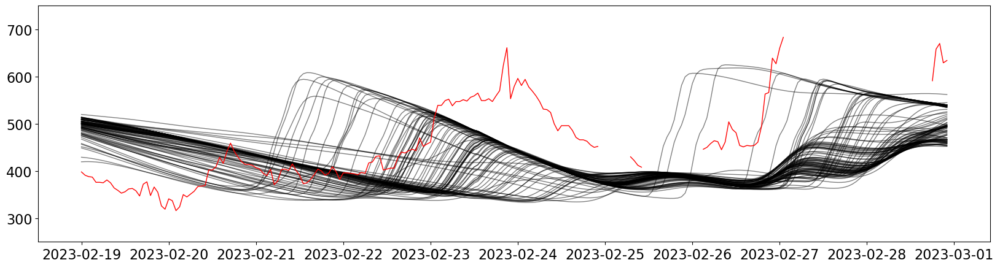

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (20,5))

# Initialize the plot with the first image

line = ax.plot(daily_ensemble_sets[0], lw=1, color='black', alpha=0.5)
ax.plot(updated_data_chunks[0], lw = 2, color = 'red')
ax.set_ylim(250,750)

# Function to update the image on each frame
def update(frame):

    ax.clear()
    ax.plot(daily_ensemble_sets[frame], lw=1, color='black', alpha=0.5)
    ax.plot(updated_data_chunks[frame], lw = 1, color = 'red')
    ax.set_ylim(250,750)

    return line

# Create the animation object
ani = FuncAnimation(fig, update, frames=50, interval=100, blit=True, repeat_delay=2500)
ani.save('daily_updated_ensemble.gif', writer='imagemagick')
HTML(ani.to_jshtml())

direct integration: term 1 = 0.850, term 2 = 0.984, crps = 1.835
discrete sum: term 1 = 3.932, term 2 = 4.030, crps = 7.962


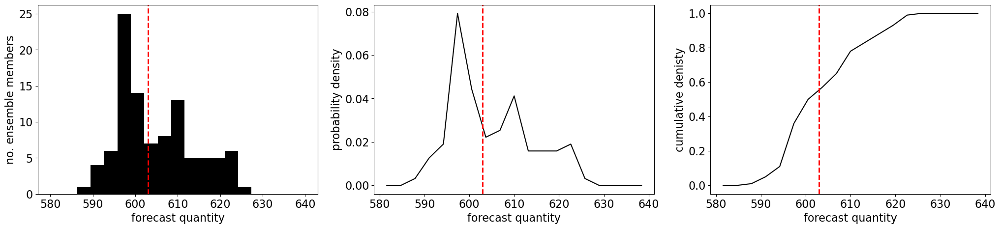

In [144]:
ensemble_slice = daily_ensemble_sets[0].iloc[0]
observation = updated_data_chunks[0].iloc[0]

# ## dummy data
# random_seed = 1234567
# rng = np.random.default_rng(random_seed)
# #ensemble_slice = rng.normal(loc=0, scale=0.1, size=1000000)
# ensemble_slice = np.zeros(10000)
# observation=1


lower_limit = 580
upper_limit = 640
#n_bins = upper_limit - lower_limit + 1
n_bins = 20

bin_edges = np.linspace(lower_limit, upper_limit, n_bins)
ensemble_hist, bin_edges = np.histogram(ensemble_slice, bins=bin_edges)

# Compute bin widths
bin_widths = np.diff(bin_edges)
bin_centres = (bin_edges[:-1] + bin_edges[1:]) / 2

# Convert to probability densities
pdf = ensemble_hist / (np.sum(ensemble_hist) * bin_widths)

# Compute CDF
cdf = np.cumsum(ensemble_hist)  
cdf = cdf / cdf[-1]    # Normalize to get values between 0 and 1


term1_index = bin_centres <= observation
term2_index = bin_centres > observation

term1 = integrate.trapezoid(cdf[term1_index]**2, bin_centres[term1_index])
term2 = integrate.trapezoid((cdf[term2_index]-1)**2, bin_centres[term2_index])
crps_int = term1 + term2

print(f'direct integration: term 1 = {term1:.3f}, term 2 = {term2:.3f}, crps = {crps_int:.3f}')

term1_disc = np.sum((cdf[term1_index]*bin_widths[term1_index])**2)
term2_disc = np.sum(((cdf[term2_index]-1)*bin_widths[term2_index])**2)
crps_disc = term1_disc + term2_disc

print(f'discrete sum: term 1 = {term1_disc:.3f}, term 2 = {term2_disc:.3f}, crps = {crps_disc:.3f}')

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(25,5))

axes[0].bar(bin_centres, ensemble_hist, width = bin_widths, color='black')
axes[0].axvline(observation, lw=2, color='red', linestyle = '--', label='observation')
axes[0].set_xlabel('forecast quantity')
axes[0].set_ylabel('no. ensemble members')

axes[1].plot(bin_centres, pdf, color='black')
axes[1].axvline(observation, lw=2, color='red', linestyle = '--', label='observation')
axes[1].set_xlabel('forecast quantity')
axes[1].set_ylabel('probability density')

axes[2].plot(bin_centres, cdf, color='black')
axes[2].axvline(observation, lw=2, color='red', linestyle = '--', label='observation')
axes[2].set_xlabel('forecast quantity')
axes[2].set_ylabel('cumulative denisty')

plt.show()

In [145]:
def crps_discrete(ensemble_slice, observation):

    lower_limit = 200
    upper_limit = 850
    n_bins = upper_limit - lower_limit + 1

    bin_edges = np.linspace(lower_limit, upper_limit, n_bins)
    ensemble_hist, bin_edges = np.histogram(ensemble_slice, bins=bin_edges)

    # Compute bin widths
    bin_widths = np.diff(bin_edges)
    bin_centres = (bin_edges[:-1] + bin_edges[1:]) / 2

    # Convert to probability densities
    pdf = ensemble_hist / (np.sum(ensemble_hist) * bin_widths)

    # Compute CDF
    cdf = np.cumsum(ensemble_hist)  
    cdf = cdf / cdf[-1]    # Normalize to get values between 0 and 1

    # compute crps by evaluating the two halves of the cdf split by the observation
    term1_index = bin_centres <= observation
    term2_index = bin_centres > observation

    term1 = integrate.trapezoid(cdf[term1_index]**2, bin_centres[term1_index])
    term2 = integrate.trapezoid((cdf[term2_index]-1)**2, bin_centres[term2_index])
    crps_int = term1 + term2

    # term1_disc = np.sum((cdf[term1_index]*bin_widths[term1_index])**2)
    # term2_disc = np.sum(((cdf[term2_index]-1)*bin_widths[term2_index])**2)
    # crps_disc = term1_disc + term2_disc


    return crps_int

In [146]:
crps_sets = []

for j,_ in enumerate(daily_ensemble_sets):
    crps_list = np.array([crps_discrete(daily_ensemble_sets[j].iloc[i], updated_data_chunks[j].iloc[i]) for i in range(daily_ensemble_sets[j].shape[0])])
    crps_sets.append(crps_list)


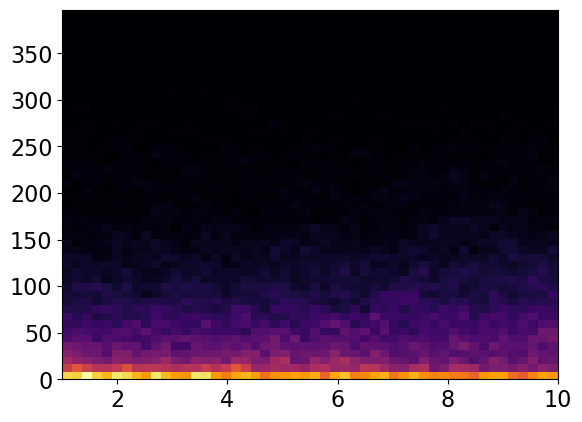

In [174]:
day_axes = []
for crps in crps_sets:
    day_axes.append(np.linspace(1,10,len(crps))[~np.isnan(crps)])


day_axes = np.concatenate(day_axes)
crps_complete = np.concatenate(crps_sets)
crps_complete = crps_complete[~np.isnan(crps_complete)]

plt.hist2d(day_axes, crps_complete, bins=50, cmap='inferno')
plt.show()


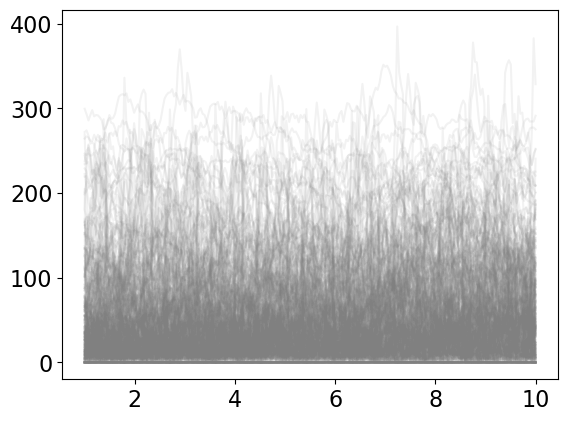

In [175]:
day_axes = []

for crps in crps_sets:
    day_axes.append(np.linspace(1,10,len(crps)))

for day_axis, crps in zip(day_axes, crps_sets):
    plt.plot(day_axis, crps, alpha = 0.1, color = 'gray')

In [ ]:
crps_sets

array([  0.     ,   0.     ,   0.     ,   0.     ,   0.     ,   0.     ,
         0.     ,   0.     ,   0.     ,   0.     ,   0.     ,   0.     ,
         0.     ,   0.     ,   0.     ,   0.     ,   0.     ,   0.     ,
         0.     ,   0.     ,   5.64605,  21.4905 ,  26.75165,  23.2357 ,
        24.6391 ,  29.77885,  23.8232 ,  22.35   ,  29.1758 ,  24.4013 ,
        26.5683 ,  43.6354 ,  50.94695,  46.2273 ,  36.4507 ,  34.1236 ,
        35.3782 ,  31.7919 ,  44.0471 ,  46.5975 ,  40.9082 ,  47.8812 ,
        14.932  ,  15.2244 ,  49.816  ,  62.70085,  68.8583 ,  75.9817 ,
        73.0289 ,  68.1321 ,  59.3119 ,  43.1363 ,  30.205  ,  30.8337 ,
        25.4301 ,  20.2453 ,   6.84525,  12.37745,  23.6297 ,  18.3389 ,
         7.4405 ,   7.6615 ,   5.29025,   5.21685,   6.00755,  10.84915,
        32.3194 ,  15.60355,   5.477  ,   9.8542 ,  38.7812 ,   3.5672 ,
        21.34095,  16.7603 ,   2.2887 ,  10.89045,  33.3052 ,   3.47995,
         6.0827 ,   5.75505,   8.15495,  73.8072 , 

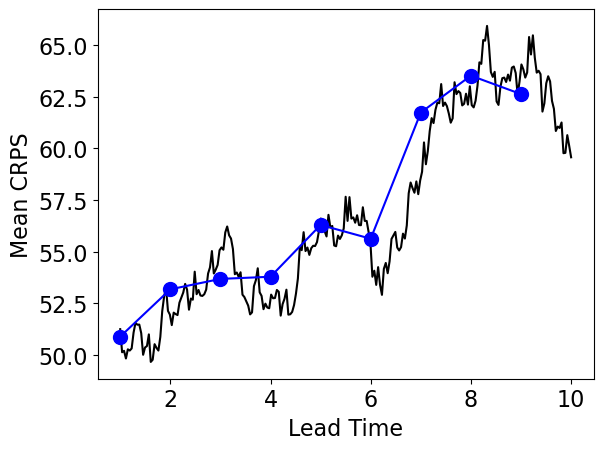

In [173]:
crps_reformat = [crps[0:237] for crps in crps_sets]
lead_time_axis = np.linspace(1,10,len(crps_reformat[0]))
day_indices = []

crps_lead_time = []
for i in range(10):
    index = (lead_time_axis > i+1) & (lead_time_axis < (i+2))
    crps_lead_time.append(np.mean([crps[index] for crps in crps_reformat]))


plt.plot(np.linspace(1,10,len(crps_reformat[0])), np.mean(crps_reformat, axis=0), color = 'black')
plt.plot(np.linspace(1,10, len(crps_lead_time)), crps_lead_time, marker='o', markersize = 10, color='blue')
plt.ylabel('Mean CRPS')
plt.xlabel('Lead Time')
plt.show()